In [23]:
from split_op_schrodinger2D import *

# load tools for creating animation
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, writers
from IPython.display import HTML, display
from matplotlib.animation import PillowWriter
# Use the documentation string for the developed class
print(SplitOpSchrodinger2D.__doc__)




    The second-order split-operator propagator of the 2D Schrodinger equation in the coordinate representation
    with the time-dependent Hamiltonian H = K(P1, P2, t) + V(X1, X2, t).
    


In [24]:
class VisualizeDynamics2D:
    """
    Class to visualize the wave function dynamics in 2D.
    """
    def __init__(self, fig):
        """
        Initialize all propagators and frame
        :param fig: matplotlib figure object
        """
        #  Initialize systems
        self.set_quantum_sys()

        #################################################################
        #
        # Initialize plotting facility
        #
        #################################################################

        self.fig = fig

        ax = fig.add_subplot(111)

        ax.set_title('Wavefunction density, $| \\Psi(x_1, x_2, t) |^2$')
        extent=[
            self.quant_sys.x2.min(),
            self.quant_sys.x2.max(),
            self.quant_sys.x1.min(),
            self.quant_sys.x1.max()
        ]
        self.img = ax.imshow([[]], extent=extent, origin='lower')

        self.fig.colorbar(self.img)

        ax.set_xlabel('$x_2$ (a.u.)')
        ax.set_ylabel('$x_1$ (a.u.)')

    def set_quantum_sys(self):
        """
        Initialize quantum propagator
        :param self:
        :return:
        """

        omega = 3.

        @njit
        def v(x1, x2, t=0.):
            """
            Potential energy
            """
            return 0.5 * omega ** 2 * (x1 ** 2 + x2 ** 2)

        @njit
        def diff_v_x1(x1, x2, t=0.):
            """
            the derivative of the potential energy for Ehrenfest theorem evaluation
            """
            return (omega) ** 2 * x1

        @njit
        def diff_v_x2(x1, x2, t=0.):
            """
            the derivative of the potential energy for Ehrenfest theorem evaluation
            """
            return (omega) ** 2 * x2

        @njit
        def k(p1, p2, t=0.):
            """
            Non-relativistic kinetic energy
            """
            return 0.5 * (p1 ** 2 + p2 ** 2)

        @njit
        def diff_k_p1(p1, p2, t=0.):
            """
            the derivative of the kinetic energy for Ehrenfest theorem evaluation
            """
            return p1

        @njit
        def diff_k_p2(p1, p2, t=0.):
            """
            the derivative of the kinetic energy for Ehrenfest theorem evaluation
            """
            return p2

        self.quant_sys = SplitOpSchrodinger2D(
            t=0.,
            dt=0.005,
            x1_grid_dim=256,
            x1_amplitude=5.,
            x2_grid_dim=256,
            x2_amplitude=5.,

            # kinetic energy part of the hamiltonian
            k=k,

            # these functions are used for evaluating the Ehrenfest theorems
            diff_k_p1=diff_k_p1,
            diff_k_p2=diff_k_p2,

            # potential energy part of the hamiltonian
            v=v,

            # these functions are used for evaluating the Ehrenfest theorems
            diff_v_x1=diff_v_x1,
            diff_v_x2=diff_v_x2,
        )

        # set randomised initial condition

        alpha1 = np.random.uniform(0.5, 3.)
        x10 = np.random.uniform(-2., 2.)
        alpha2 = np.random.uniform(0.5, 3.)
        x20 = np.random.uniform(-2., 2.)
        p1 = np.random.uniform(-2., 2.)
        p2 = np.random.uniform(-2., 2.)

        self.quant_sys.set_wavefunction(
            lambda x1, x2: np.exp(-alpha1 * (x1 + x10) ** 2 -alpha2 * (x2 + x20) ** 2 -1j * (p1 * x1 + p2 * x2))
        )

    def __call__(self, frame_num):
        """
        Draw a new frame
        :param frame_num: current frame number
        :return: image objects
        """
        # propagate and set the density
        self.img.set_array(
            np.abs(self.quant_sys.propagate(10)) ** 2
        )
        return self.img,

In [25]:
plt.figure(dpi=350)
fig = plt.gcf()
visualizer = VisualizeDynamics2D(fig)
animation = FuncAnimation(
    fig, visualizer, frames=np.arange(100), repeat=True, blit=True
)

display(HTML(animation.to_jshtml()))

# plt.show()
plt.close()

In [26]:
# If you want to make a movie, comment "plt.show()" out and uncomment the lines bellow


# # Set up formatting for the movie files
# writer = PillowWriter(fps=10, metadata=dict(artist='a good student'))
# # Save animation into the file
# animation.save('2D_Schrodinger.gif', writer=writer)

In [27]:
# extract the reference to quantum system
quant_sys = visualizer.quant_sys

# Analyze how well the energy was preserved
h = np.array(quant_sys.hamiltonian_average)
print(
    "\nHamiltonian is preserved within the accuracy of {:.1e} percent".format(
        100. * (1. - h.min()/h.max())
    )
)


Hamiltonian is preserved within the accuracy of 4.4e-03 percent


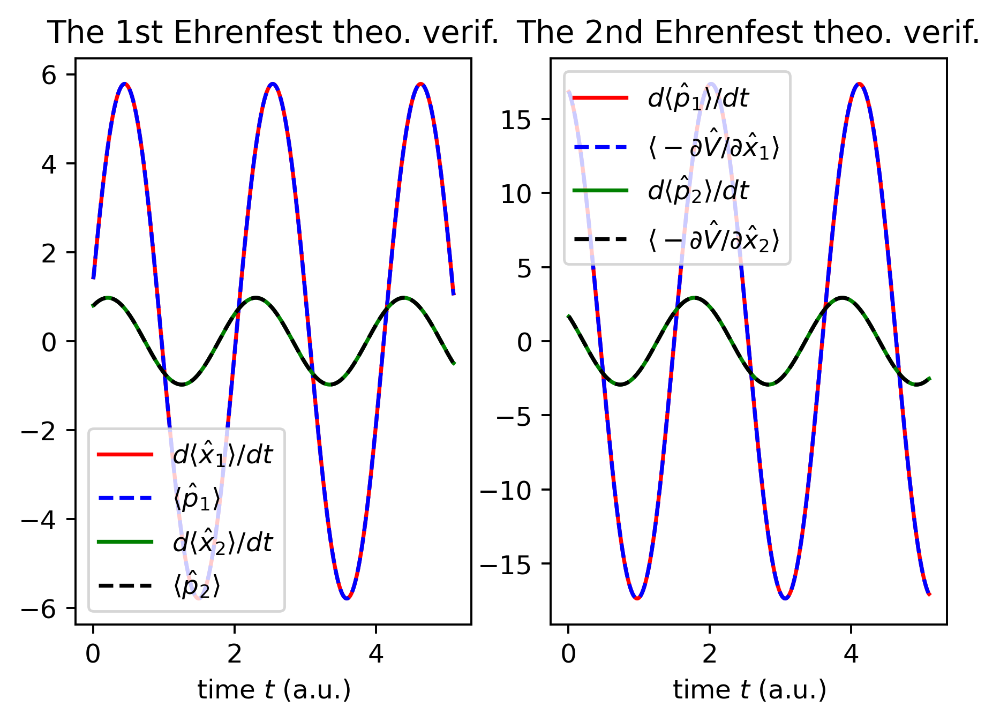

In [29]:
#################################################################
#
# Plot the Ehrenfest theorems after the animation is over
#
#################################################################

# generate time step grid
dt = quant_sys.dt
times = np.arange(dt, dt + dt*len(quant_sys.x1_average), dt)[:-1]

plt.figure(dpi=350)
plt.subplot(121)
plt.title("The 1st Ehrenfest theo. verif.")

plt.plot(
    times,
    np.gradient(quant_sys.x1_average, dt),
    'r-',
    label='$d\\langle \\hat{x}_1 \\rangle/dt$'
)
plt.plot(
    times,
    quant_sys.x1_average_rhs,
    'b--', label='$\\langle \\hat{p}_1 \\rangle$'
)

plt.plot(
    times,
    np.gradient(quant_sys.x2_average, dt),
    'g-',
    label='$d\\langle \\hat{x}_2 \\rangle/dt$'
)
plt.plot(
    times,
    quant_sys.x2_average_rhs,
    'k--',
    label='$\\langle \\hat{p}_2 \\rangle$'
)

plt.legend()
plt.xlabel('time $t$ (a.u.)')

plt.subplot(122)
plt.title("The 2nd Ehrenfest theo. verif.")

plt.plot(
    times,
    np.gradient(quant_sys.p1_average, dt),
    'r-',
    label='$d\\langle \\hat{p}_1 \\rangle/dt$'
)
plt.plot(
    times,
    quant_sys.p1_average_rhs,
    'b--',
    label='$\\langle -\\partial\\hat{V}/\\partial\\hat{x}_1 \\rangle$'
)

plt.plot(
    times,
    np.gradient(quant_sys.p2_average, dt),
    'g-',
    label='$d\\langle \\hat{p}_2 \\rangle/dt$'
)
plt.plot(
    times,
    quant_sys.p2_average_rhs,
    'k--',
    label='$\\langle -\\partial\\hat{V}/\\partial\\hat{x}_2 \\rangle$'
)

plt.legend()
plt.xlabel('time $t$ (a.u.)')

plt.show()